# Full Composition Model Train

1. Gradient Boosting Decision Trees (GBDT)
2. Kernel Ridge Regression (KRR)
3. Random Forest (RF)
4. Ridge Regression (RR) 
5. Support Vector Regression (SVR)


In [9]:
# import libraries
import os
import sys
import numpy as np
import pandas as pd
# Set random seed for reproducibility
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)

In [10]:
current_path = os.getcwd()
current_path

'c:\\Users\\Fortyfour\\Desktop\\graduation_design\\Scripts_git\\Models'

In [35]:
# To import the custom module from a specific path
sys.path.insert(0, os.path.join(current_path, '../'))
# Importing the custom module
from Utools.draw import plot_feature_importance, plot_feature_importance
from Utools.SingleModel import SingleModel

In [36]:
# Import sklearn models
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.kernel_approximation import Nystroem
from sklearn.linear_model import Ridge
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline

## Load Data

In [13]:
# Load data
file_dir = os.path.join(current_path, '../Data/composition_data/feature_data')
# dft data
dft_train = pd.read_csv(os.path.join(file_dir, 'dft', 'train.csv'))
dft_test = pd.read_csv(os.path.join(file_dir, 'dft', 'test.csv'))
# exp data
exp_train = pd.read_csv(os.path.join(file_dir, 'exp', 'train.csv'))
exp_test = pd.read_csv(os.path.join(file_dir, 'exp', 'test.csv'))

In [14]:
dft_train_X = dft_train.drop(columns=['composition', 'band_gap'])
dft_train_y = dft_train['band_gap']
exp_train_X = exp_train.drop(columns=['composition', 'band_gap'])
exp_train_y = exp_train['band_gap']
dft_test_X = dft_test.drop(columns=['composition', 'band_gap'])
dft_test_y = dft_test['band_gap']
exp_test_X = exp_test.drop(columns=['composition', 'band_gap'])
exp_test_y = exp_test['band_gap']

In [15]:
# save model performance as df
model_metrics = pd.DataFrame(columns=['Model', 'Train', 'Test', 'R²', 'RMSE', 'MAE'])

## Model Training

### 1. Gradient Boosting Decision Tree (GBDT)

In [16]:
file_path = os.path.join(current_path, 'GBDT')
file_path

'c:\\Users\\Fortyfour\\Desktop\\graduation_design\\Scripts_git\\Models\\GBDT'

In [17]:
gbr_model = GradientBoostingRegressor(
    n_estimators=500,
    learning_rate=0.1,
    max_features='sqrt',
    random_state=RANDOM_SEED
)

gbdt = SingleModel(gbr_model, random_state=42)

#### 1.1 DFT model

In [18]:
# dft train
gbdt.train(dft_train_X, dft_train_y)

Starting model training...
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.1s
[Pipeline] ............. (step 2 of 2) Processing model, total=  27.4s
Model training completed!


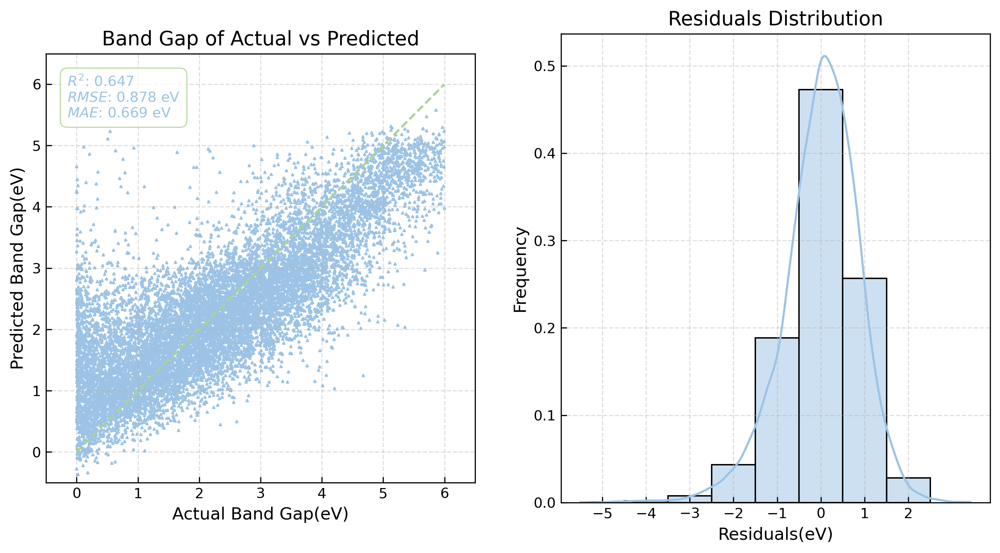


Model Evaluation Results:
Test set: R²: 0.6475 RMSE: 0.8776 MAE: 0.6692


In [19]:
# test on dft test set
metrics = gbdt.evaluate(dft_test_X, dft_test_y, fig_path=os.path.join(file_path, 'figures', 'dft_train_dft_test.png'))
# record metrics
model_metrics.loc[len(model_metrics)] = {
    'Model': 'krr',
    'Train': 'dft',
    'Test': 'dft',
    'R²': metrics['r2'],
    'RMSE': metrics['rmse'],
    'MAE': metrics['mae']
}

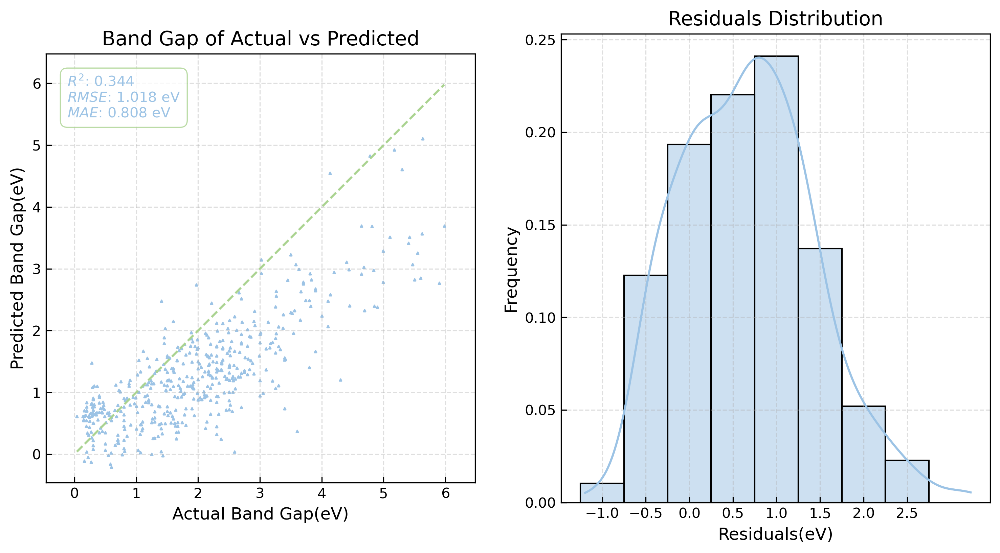


Model Evaluation Results:
Test set: R²: 0.3437 RMSE: 1.0181 MAE: 0.8084


In [20]:
# test on exp test set
metrics = gbdt.evaluate(exp_test_X, exp_test_y, fig_path=os.path.join(file_path, 'figures', 'dft_train_exp_test.png'))
# record metrics
model_metrics.loc[len(model_metrics)] = {
    'Model': 'GBDT',
    'Train': 'dft',
    'Test': 'exp',
    'R²': metrics['r2'],
    'RMSE': metrics['rmse'],
    'MAE': metrics['mae']
}

In [21]:
# dft train model save
gbdt.save_model(os.path.join(file_path, 'model', 'dft_train_model.pkl'))
# model predictions save
gbdt.save_prediction(dft_test_X, dft_test_y, os.path.join(file_path, 'predictions', 'dft_train_dft_test.csv'), save_df=dft_test)
gbdt.save_prediction(exp_test_X, exp_test_y, os.path.join(file_path, 'predictions', 'dft_train_exp_test.csv'), save_df=exp_test)

Model saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\GBDT\model\dft_train_model.pkl
Predictions saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\GBDT\predictions\dft_train_dft_test.csv
Predictions saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\GBDT\predictions\dft_train_exp_test.csv


#### 1.2 EXP model

Starting model training...
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............. (step 2 of 2) Processing model, total=   1.6s
Model training completed!


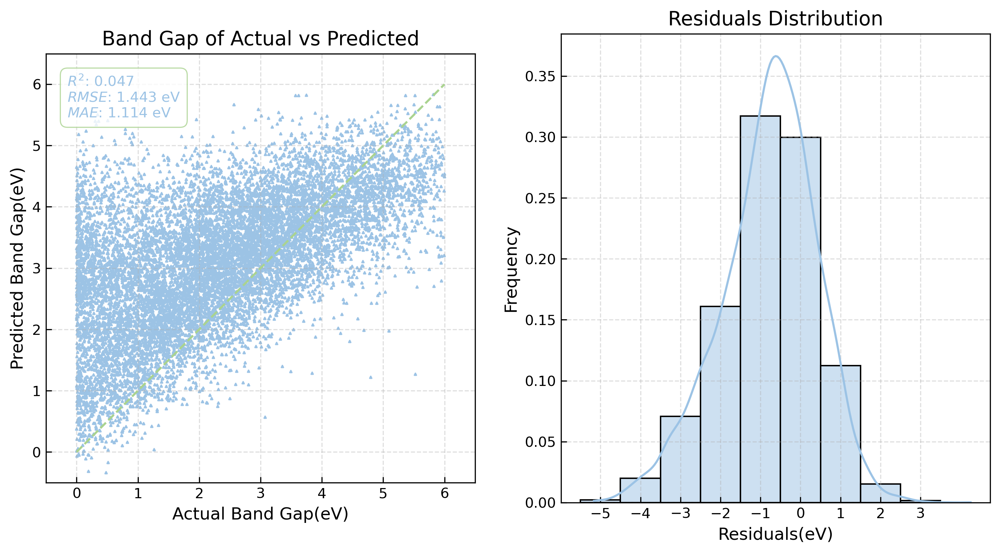


Model Evaluation Results:
Test set: R²: 0.0470 RMSE: 1.4430 MAE: 1.1143


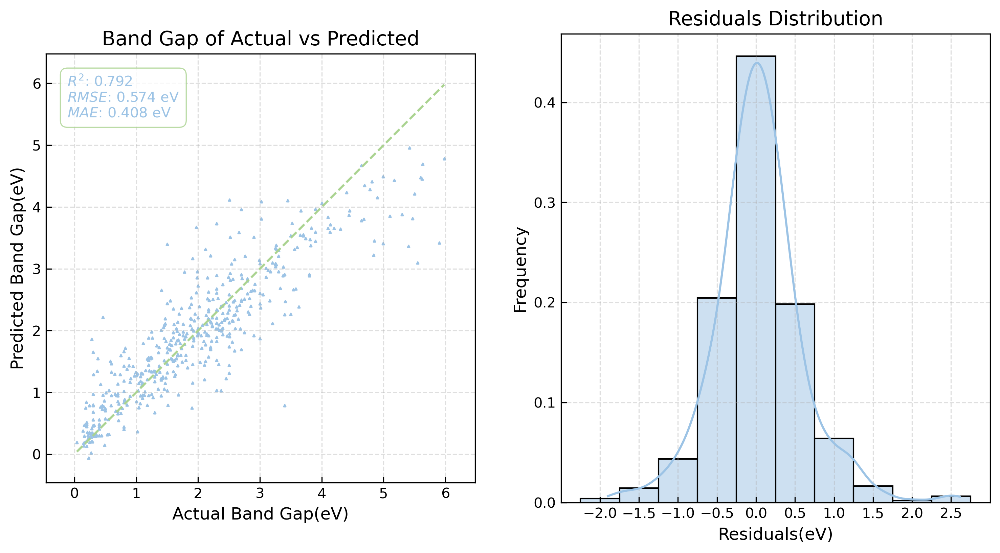


Model Evaluation Results:
Test set: R²: 0.7916 RMSE: 0.5737 MAE: 0.4085


In [ ]:
# exp train
gbdt.train(exp_train_X, exp_train_y)
# test on dft test set
metrics = gbdt.evaluate(dft_test_X, dft_test_y, fig_path=os.path.join(file_path, 'figures', 'exp_train_dft_test.png'))
# record metrics
model_metrics.loc[len(model_metrics)] = {
    'Model': 'GBDT',
    'Train': 'exp',
    'Test': 'dft',
    'R²': metrics['r2'],
    'RMSE': metrics['rmse'],
    'MAE': metrics['mae']
}
# test on exp test set
metrics = gbdt.evaluate(exp_test_X, exp_test_y, fig_path=os.path.join(file_path, 'figures', 'exp_train_exp_test.png'))
# record metrics
model_metrics.loc[len(model_metrics)] = {
    'Model': 'GBDT',
    'Train': 'exp',
    'Test': 'exp',
    'R²': metrics['r2'],
    'RMSE': metrics['rmse'],
    'MAE': metrics['mae']
}


In [23]:
model_metrics.head()

,Model,Train,Test,R²,RMSE,MAE
0,GBDT,dft,dft,0.647468,0.877631,0.669231
1,GBDT,dft,exp,0.343692,1.018073,0.808413
2,GBDT,exp,dft,0.046973,1.442996,1.114322
3,GBDT,exp,exp,0.791603,0.573681,0.408493


In [ ]:
# exp train model save
gbdt.save_model(os.path.join(file_path, 'model', 'exp_train_model.pkl'))
# model predictions save
gbdt.save_prediction(dft_test_X, dft_test_y, os.path.join(file_path, 'predictions', 'exp_train_dft_test.csv'), save_df=dft_test)
gbdt.save_prediction(exp_test_X, exp_test_y, os.path.join(file_path, 'predictions', 'exp_train_exp_test.csv'), save_df=exp_test)

Model saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\GBDT\model\exp_train_model.pkl
Predictions saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\GBDT\predictions\exp_train_dft_test.csv
Predictions saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\GBDT\predictions\exp_train_exp_test.csv


### 2. Kernel Ridge Regression(KRR)

In [26]:
file_path = os.path.join(current_path, 'KRR')
# krr_model = KernelRidge(kernel='rbf', alpha=1.0, gamma=0.1)
# As the memory is not enough, we need to use the kernel approximation
# create the kernel approximation model
n_components = 8000  # approximation dimension, you can adjust this value
kernel_approx = Pipeline([
    ('nystroem', Nystroem(kernel='rbf',  n_components=n_components, random_state=RANDOM_SEED)),
    ('ridge', Ridge(alpha=1.0))
])
krr = SingleModel(kernel_approx, random_state=RANDOM_SEED)

#### 2.1 DFT Model

Starting model training...
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.1s
[Pipeline] ............. (step 2 of 2) Processing model, total= 6.7min
Model training completed!


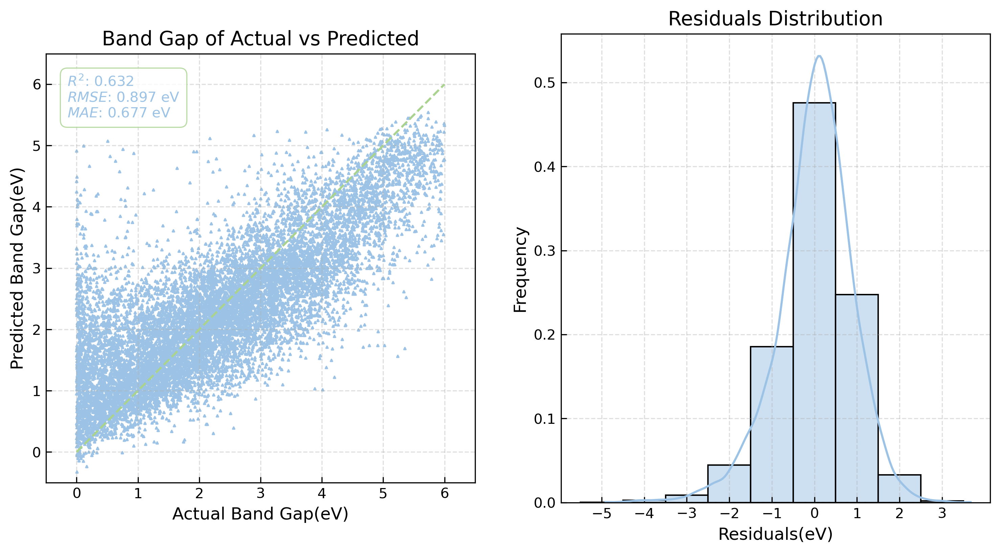


Model Evaluation Results:
Test set: R²: 0.6317 RMSE: 0.8970 MAE: 0.6770


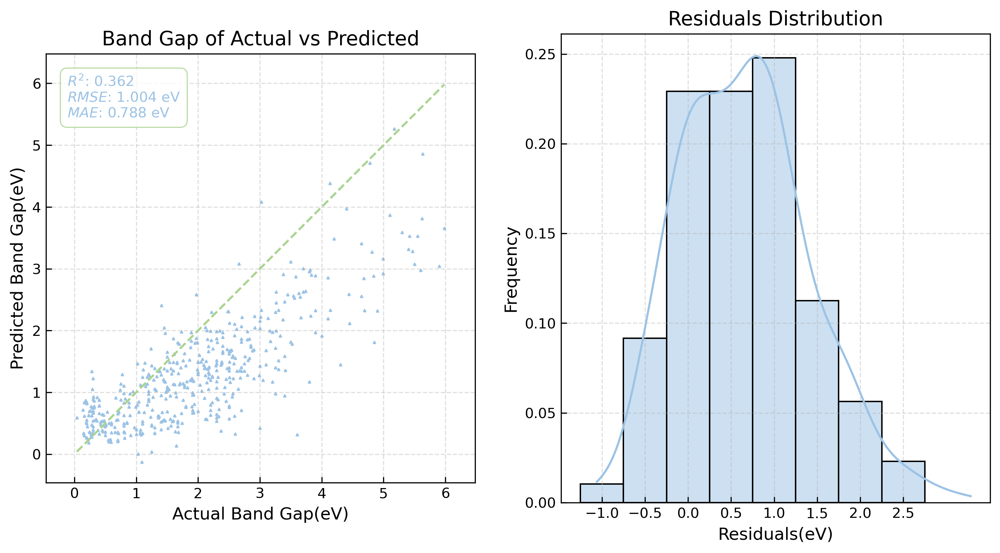


Model Evaluation Results:
Test set: R²: 0.3615 RMSE: 1.0041 MAE: 0.7884


In [27]:
# dft train
krr.train(dft_train_X, dft_train_y)
# test on dft test set
metrics = krr.evaluate(dft_test_X, dft_test_y, fig_path=os.path.join(file_path, 'figures', 'dft_train_dft_test.png'))
# record metrics
model_metrics.loc[len(model_metrics)] = {
    'Model': 'KRR',
    'Train': 'dft',
    'Test': 'dft',
    'R²': metrics['r2'],
    'RMSE': metrics['rmse'],
    'MAE': metrics['mae']
}
# test on exp test set
metrics = krr.evaluate(exp_test_X, exp_test_y, fig_path=os.path.join(file_path, 'figures', 'dft_train_exp_test.png'))
# record metrics
model_metrics.loc[len(model_metrics)] = {
    'Model': 'KRR',
    'Train': 'dft',
    'Test': 'exp',
    'R²': metrics['r2'],
    'RMSE': metrics['rmse'],
    'MAE': metrics['mae']
}

In [29]:
# dft train model save
krr.save_model(os.path.join(file_path, 'model', 'dft_train_model.pkl'))
# model predictions save
krr.save_prediction(dft_test_X, dft_test_y, os.path.join(file_path, 'predictions', 'dft_train_dft_test.csv'), save_df=dft_test)
krr.save_prediction(exp_test_X, exp_test_y, os.path.join(file_path, 'predictions', 'dft_train_exp_test.csv'), save_df=exp_test)

Model saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\KRR\model\dft_train_model.pkl
Predictions saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\KRR\predictions\dft_train_dft_test.csv
Predictions saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\KRR\predictions\dft_train_exp_test.csv


#### 2.2 EXP model

Starting model training...
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s


e:\software2\Anaconda\Lib\site-packages\sklearn\kernel_approximation.py:1020: UserWarning: n_components > n_samples. This is not possible.
n_components was set to n_samples, which results in inefficient evaluation of the full kernel.
  warnings.warn(


[Pipeline] ............. (step 2 of 2) Processing model, total=   7.1s
Model training completed!


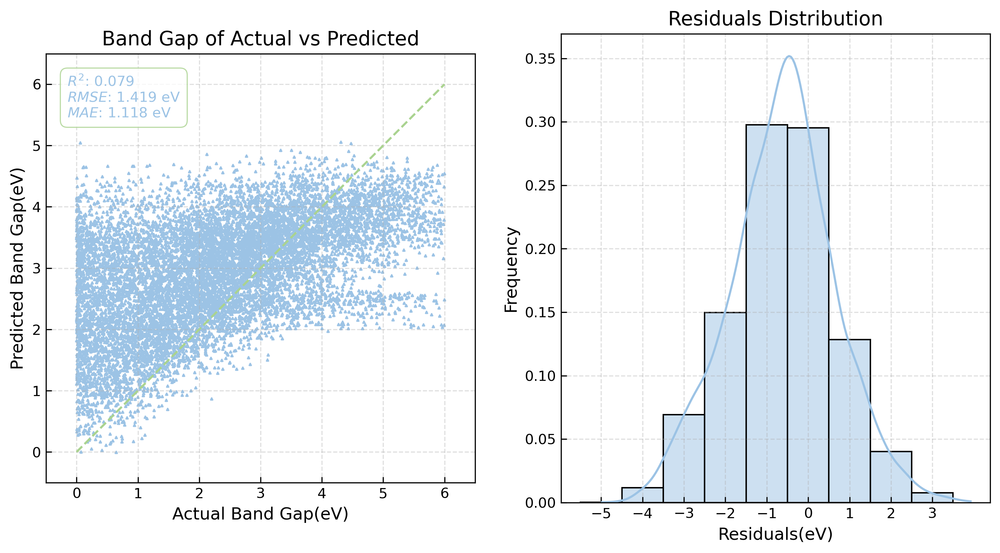


Model Evaluation Results:
Test set: R²: 0.0787 RMSE: 1.4188 MAE: 1.1184


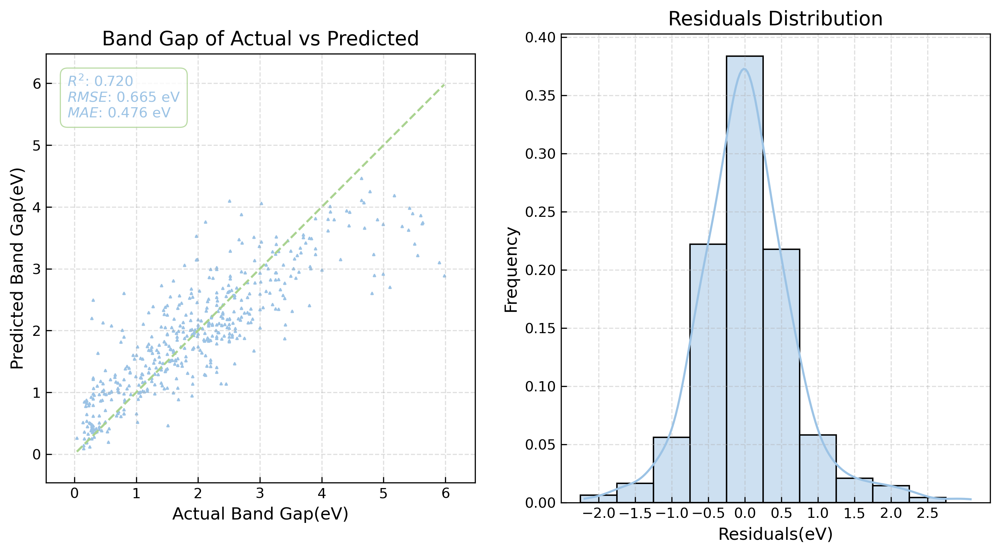


Model Evaluation Results:
Test set: R²: 0.7201 RMSE: 0.6648 MAE: 0.4755


In [30]:
# exp train
krr.train(exp_train_X, exp_train_y)
# test on dft test set
metrics = krr.evaluate(dft_test_X, dft_test_y, fig_path=os.path.join(file_path, 'figures', 'exp_train_dft_test.png'))
# record metrics
model_metrics.loc[len(model_metrics)] = {
    'Model': 'KRR',
    'Train': 'exp',
    'Test': 'dft',
    'R²': metrics['r2'],
    'RMSE': metrics['rmse'],
    'MAE': metrics['mae']
}
# test on exp test set
metrics = krr.evaluate(exp_test_X, exp_test_y, fig_path=os.path.join(file_path, 'figures', 'exp_train_exp_test.png'))
# record metrics
model_metrics.loc[len(model_metrics)] = {
    'Model': 'KRR',
    'Train': 'exp',
    'Test': 'exp',
    'R²': metrics['r2'],
    'RMSE': metrics['rmse'],
    'MAE': metrics['mae']
}


In [31]:
# exp train model save
krr.save_model(os.path.join(file_path, 'model', 'exp_train_model.pkl'))
# model predictions save
krr.save_prediction(dft_test_X, dft_test_y, os.path.join(file_path, 'predictions', 'exp_train_dft_test.csv'), save_df=dft_test)
krr.save_prediction(exp_test_X, exp_test_y, os.path.join(file_path, 'predictions', 'exp_train_exp_test.csv'), save_df=exp_test)

Model saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\KRR\model\exp_train_model.pkl
Predictions saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\KRR\predictions\exp_train_dft_test.csv
Predictions saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\KRR\predictions\exp_train_exp_test.csv


In [32]:
model_metrics

,Model,Train,Test,R²,RMSE,MAE
0,GBDT,dft,dft,0.647468,0.877631,0.669231
1,GBDT,dft,exp,0.343692,1.018073,0.808413
2,GBDT,exp,dft,0.046973,1.442996,1.114322
3,GBDT,exp,exp,0.791603,0.573681,0.408493
4,KRR,dft,dft,0.631742,0.896992,0.676967
5,KRR,dft,exp,0.361538,1.004136,0.788429
6,KRR,exp,dft,0.078652,1.418811,1.118420
7,KRR,exp,exp,0.720112,0.664840,0.475530


### 3. Random Forest(RF)

In [33]:
file_path = os.path.join(current_path, 'RF')
rf_model = RandomForestRegressor(n_estimators=500, max_depth=None, max_features=0.25, random_state=RANDOM_SEED, n_jobs=-1)
rf = SingleModel(rf_model, random_state=RANDOM_SEED)

#### 3.1 DFT Model

Starting model training...
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.2s
[Pipeline] ............. (step 2 of 2) Processing model, total= 1.1min
Model training completed!


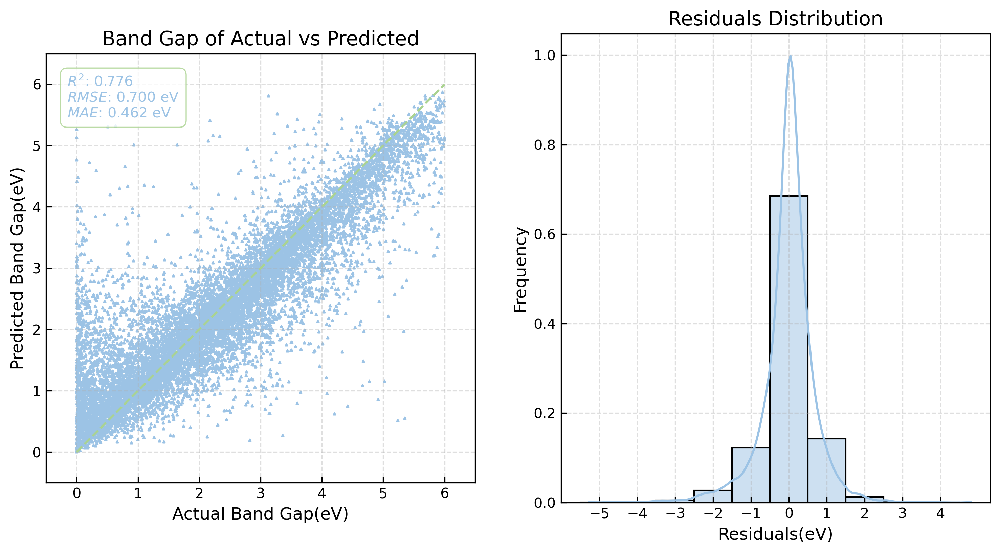


Model Evaluation Results:
Test set: R²: 0.7758 RMSE: 0.6999 MAE: 0.4622


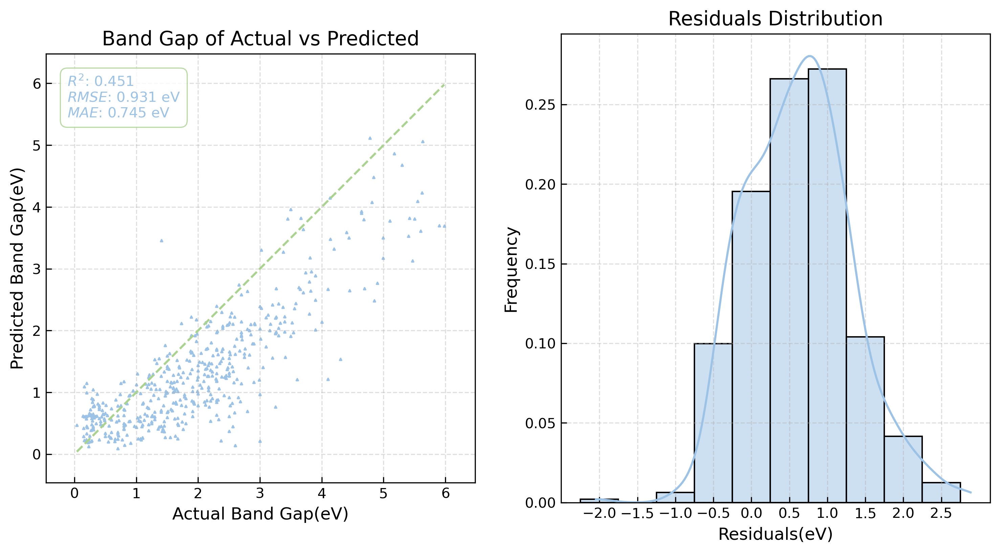


Model Evaluation Results:
Test set: R²: 0.4513 RMSE: 0.9309 MAE: 0.7445


In [34]:
# dft train
rf.train(dft_train_X, dft_train_y)
# test on dft test set
metrics = rf.evaluate(dft_test_X, dft_test_y, fig_path=os.path.join(file_path, 'figures', 'dft_train_dft_test.png'))
# record metrics
model_metrics.loc[len(model_metrics)] = {
    'Model': 'RF',
    'Train': 'dft',
    'Test': 'dft',
    'R²': metrics['r2'],
    'RMSE': metrics['rmse'],
    'MAE': metrics['mae']
}
# test on exp test set
metrics = rf.evaluate(exp_test_X, exp_test_y, fig_path=os.path.join(file_path, 'figures', 'dft_train_exp_test.png'))
# record metrics
model_metrics.loc[len(model_metrics)] = {
    'Model': 'RF',
    'Train': 'dft',
    'Test': 'exp',
    'R²': metrics['r2'],
    'RMSE': metrics['rmse'],
    'MAE': metrics['mae']
}

In [37]:
# dft train model save
rf.save_model(os.path.join(file_path, 'model', 'dft_train_model.pkl'))
# model predictions save
rf.save_prediction(dft_test_X, dft_test_y, os.path.join(file_path, 'predictions', 'dft_train_dft_test.csv'), save_df=dft_test)
rf.save_prediction(exp_test_X, exp_test_y, os.path.join(file_path, 'predictions', 'dft_train_exp_test.csv'), save_df=exp_test)

Model saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\RF\model\dft_train_model.pkl
Predictions saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\RF\predictions\dft_train_dft_test.csv
Predictions saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\RF\predictions\dft_train_exp_test.csv


##### Feature Importance

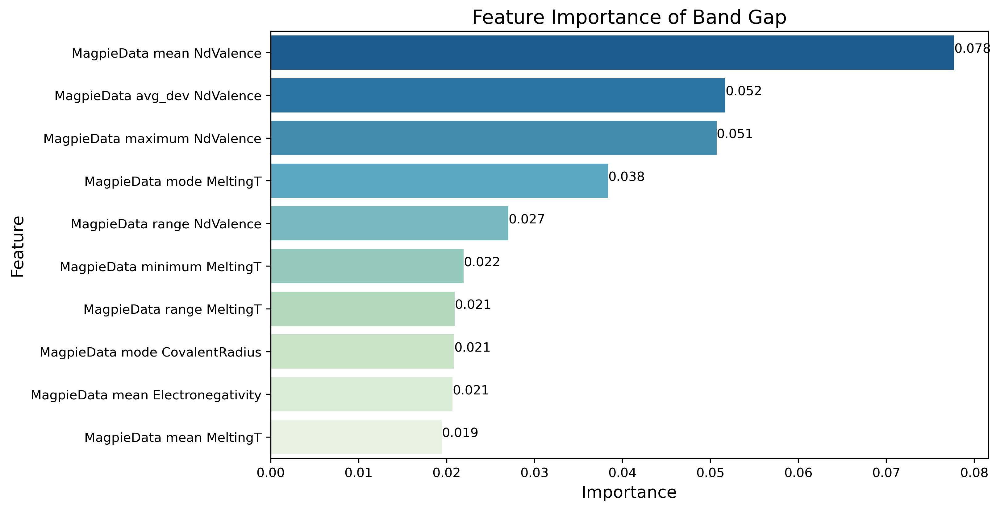

In [39]:
fig_path = os.path.join(file_path, 'figures', 'feature_importance_dft.png')
importances_df = plot_feature_importance(rf.get_model(), dft_train_X.columns, top_n=10, fig_path=fig_path)

#### 3.2 EXP model

Starting model training...
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............. (step 2 of 2) Processing model, total=   2.8s
Model training completed!


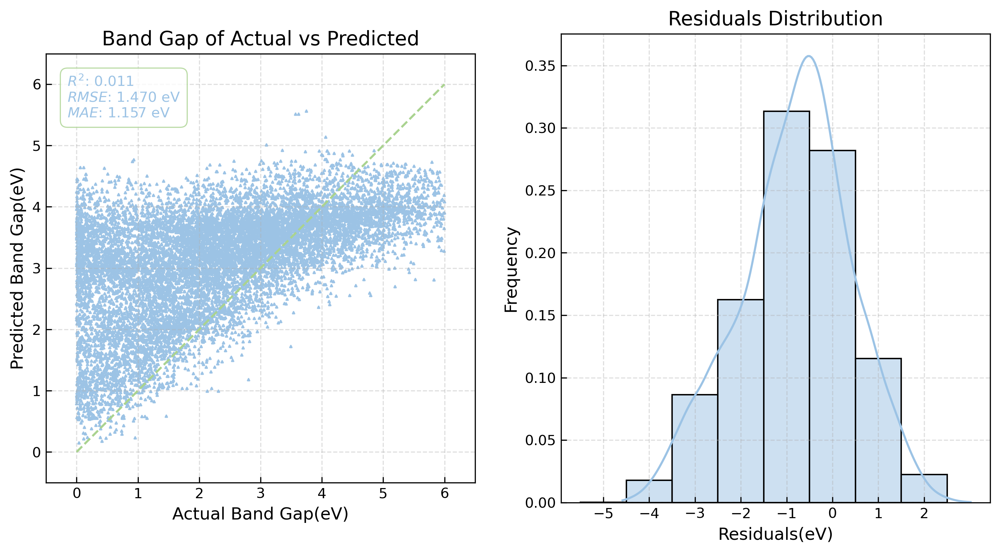


Model Evaluation Results:
Test set: R²: 0.0109 RMSE: 1.4701 MAE: 1.1567


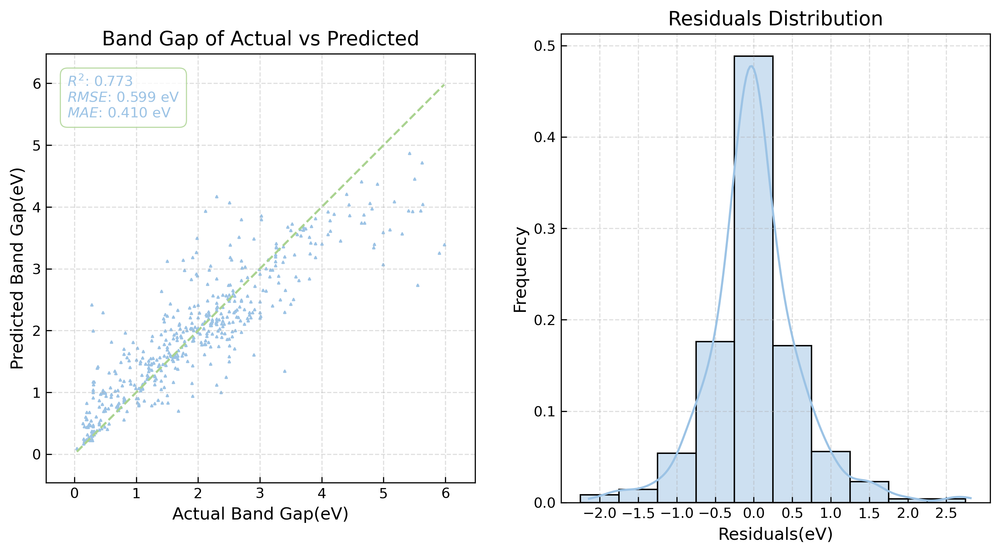


Model Evaluation Results:
Test set: R²: 0.7727 RMSE: 0.5991 MAE: 0.4096


In [40]:
# exp train
rf.train(exp_train_X, exp_train_y)
# test on dft test set
metrics = rf.evaluate(dft_test_X, dft_test_y, fig_path=os.path.join(file_path, 'figures', 'exp_train_dft_test.png'))
# record metrics
model_metrics.loc[len(model_metrics)] = {
    'Model': 'RF',
    'Train': 'exp',
    'Test': 'dft',
    'R²': metrics['r2'],
    'RMSE': metrics['rmse'],
    'MAE': metrics['mae']
}
# test on exp test set
metrics = rf.evaluate(exp_test_X, exp_test_y, fig_path=os.path.join(file_path, 'figures', 'exp_train_exp_test.png'))
# record metrics
model_metrics.loc[len(model_metrics)] = {
    'Model': 'RF',
    'Train': 'exp',
    'Test': 'exp',
    'R²': metrics['r2'],
    'RMSE': metrics['rmse'],
    'MAE': metrics['mae']
}


In [41]:
# exp train model save
rf.save_model(os.path.join(file_path, 'model', 'exp_train_model.pkl'))
# model predictions save
rf.save_prediction(dft_test_X, dft_test_y, os.path.join(file_path, 'predictions', 'exp_train_dft_test.csv'), save_df=dft_test)
rf.save_prediction(exp_test_X, exp_test_y, os.path.join(file_path, 'predictions', 'exp_train_exp_test.csv'), save_df=exp_test)

Model saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\RF\model\exp_train_model.pkl
Predictions saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\RF\predictions\exp_train_dft_test.csv
Predictions saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\RF\predictions\exp_train_exp_test.csv


##### Feature Importance

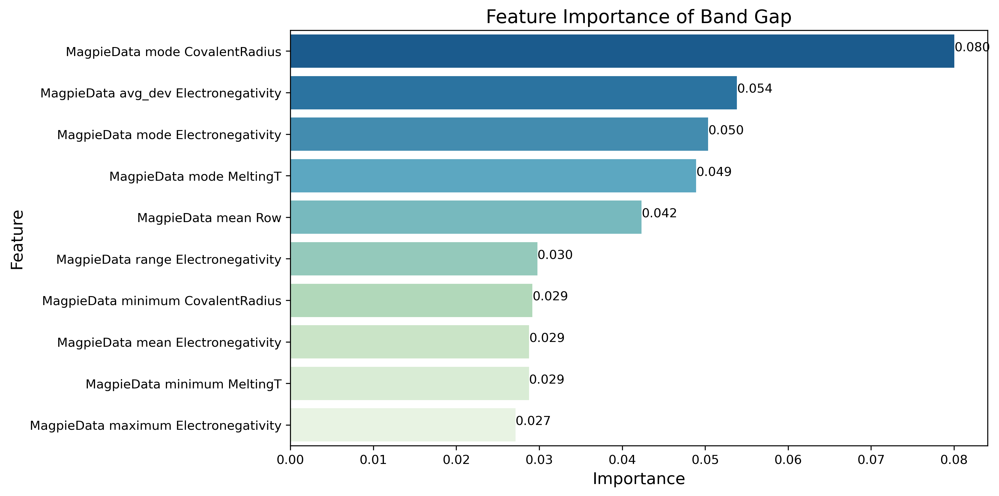

In [42]:
fig_path = os.path.join(file_path, 'figures', 'feature_importance_exp.png')
importances_df = plot_feature_importance(rf.get_model(), exp_train_X.columns, top_n=10, fig_path=fig_path)

In [43]:
model_metrics

,Model,Train,Test,R²,RMSE,MAE
0,GBDT,dft,dft,0.647468,0.877631,0.669231
1,GBDT,dft,exp,0.343692,1.018073,0.808413
2,GBDT,exp,dft,0.046973,1.442996,1.114322
3,GBDT,exp,exp,0.791603,0.573681,0.408493
4,KRR,dft,dft,0.631742,0.896992,0.676967
5,KRR,dft,exp,0.361538,1.004136,0.788429
6,KRR,exp,dft,0.078652,1.418811,1.118420
7,KRR,exp,exp,0.720112,0.664840,0.475530
8,RF,dft,dft,0.775766,0.699945,0.462198
9,RF,dft,exp,0.451256,0.930914,0.744540


### 4. Ridge Regression(RR)

In [44]:
file_path = os.path.join(current_path, 'RR')
ridge_model = Ridge(alpha=1.0, random_state=RANDOM_SEED)
rr = SingleModel(ridge_model, random_state=RANDOM_SEED)

#### 4.1 DFT Model

Starting model training...
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.1s
[Pipeline] ............. (step 2 of 2) Processing model, total=   0.1s
Model training completed!


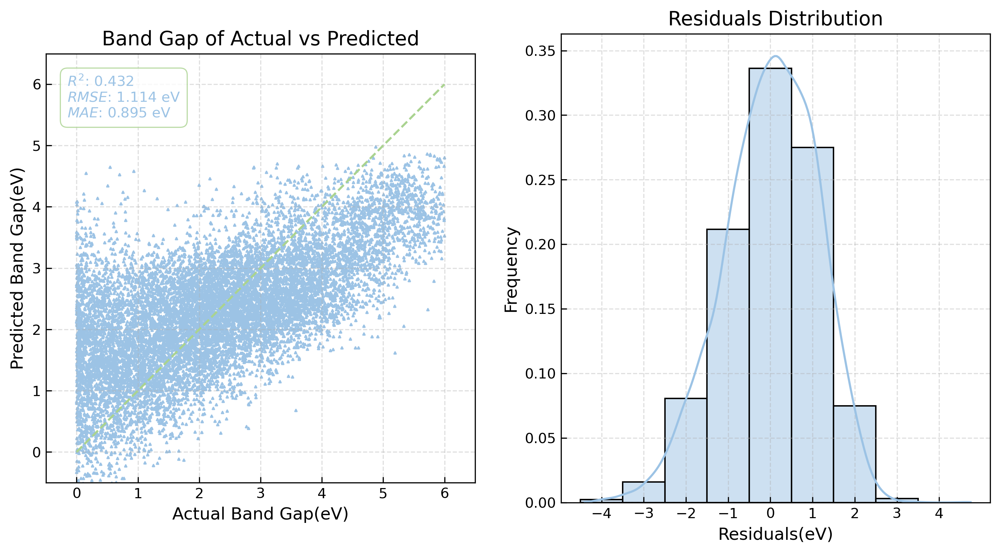


Model Evaluation Results:
Test set: R²: 0.4318 RMSE: 1.1142 MAE: 0.8947


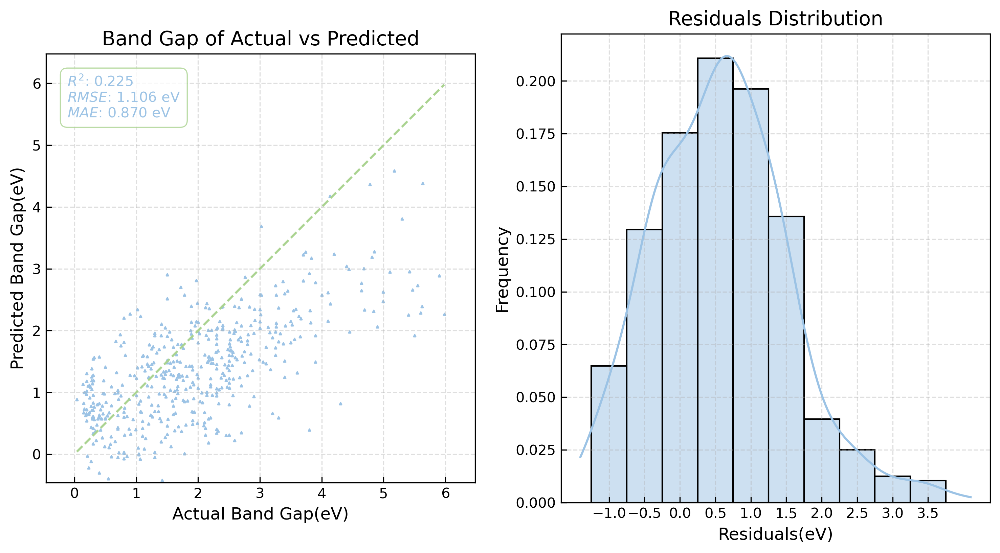


Model Evaluation Results:
Test set: R²: 0.2249 RMSE: 1.1064 MAE: 0.8698


In [45]:
# dft train
rr.train(dft_train_X, dft_train_y)
# test on dft test set
metrics = rr.evaluate(dft_test_X, dft_test_y, fig_path=os.path.join(file_path, 'figures', 'dft_train_dft_test.png'))
# record metrics
model_metrics.loc[len(model_metrics)] = {
    'Model': 'RR',
    'Train': 'dft',
    'Test': 'dft',
    'R²': metrics['r2'],
    'RMSE': metrics['rmse'],
    'MAE': metrics['mae']
}
# test on exp test set
metrics = rr.evaluate(exp_test_X, exp_test_y, fig_path=os.path.join(file_path, 'figures', 'dft_train_exp_test.png'))
# record metrics
model_metrics.loc[len(model_metrics)] = {
    'Model': 'RR',
    'Train': 'dft',
    'Test': 'exp',
    'R²': metrics['r2'],
    'RMSE': metrics['rmse'],
    'MAE': metrics['mae']
}

In [46]:
# dft train model save
rr.save_model(os.path.join(file_path, 'model', 'dft_train_model.pkl'))
# model predictions save
rr.save_prediction(dft_test_X, dft_test_y, os.path.join(file_path, 'predictions', 'dft_train_dft_test.csv'), save_df=dft_test)
rr.save_prediction(exp_test_X, exp_test_y, os.path.join(file_path, 'predictions', 'dft_train_exp_test.csv'), save_df=exp_test)

Model saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\RR\model\dft_train_model.pkl
Predictions saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\RR\predictions\dft_train_dft_test.csv
Predictions saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\RR\predictions\dft_train_exp_test.csv


#### 4.2 EXP model

Starting model training...
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............. (step 2 of 2) Processing model, total=   0.0s
Model training completed!


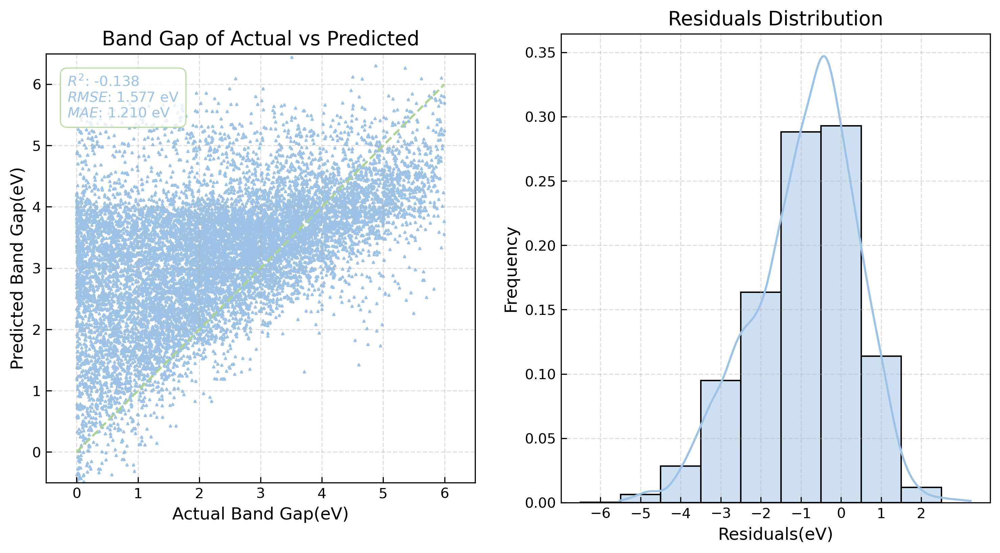


Model Evaluation Results:
Test set: R²: -0.1378 RMSE: 1.5767 MAE: 1.2100


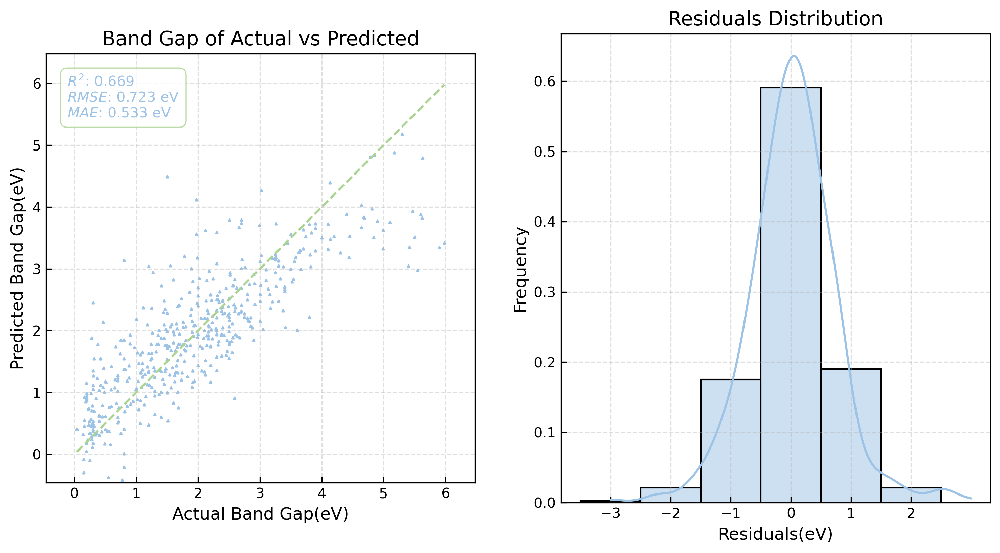


Model Evaluation Results:
Test set: R²: 0.6686 RMSE: 0.7234 MAE: 0.5330


In [47]:
# exp train
rr.train(exp_train_X, exp_train_y)
# test on dft test set
metrics = rr.evaluate(dft_test_X, dft_test_y, fig_path=os.path.join(file_path, 'figures', 'exp_train_dft_test.png'))
# record metrics
model_metrics.loc[len(model_metrics)] = {
    'Model': 'RR',
    'Train': 'exp',
    'Test': 'dft',
    'R²': metrics['r2'],
    'RMSE': metrics['rmse'],
    'MAE': metrics['mae']
}
# test on exp test set
metrics = rr.evaluate(exp_test_X, exp_test_y, fig_path=os.path.join(file_path, 'figures', 'exp_train_exp_test.png'))
# record metrics
model_metrics.loc[len(model_metrics)] = {
    'Model': 'RR',
    'Train': 'exp',
    'Test': 'exp',
    'R²': metrics['r2'],
    'RMSE': metrics['rmse'],
    'MAE': metrics['mae']
}


In [48]:
# exp train model save
rr.save_model(os.path.join(file_path, 'model', 'exp_train_model.pkl'))
# model predictions save
rr.save_prediction(dft_test_X, dft_test_y, os.path.join(file_path, 'predictions', 'exp_train_dft_test.csv'), save_df=dft_test)
rr.save_prediction(exp_test_X, exp_test_y, os.path.join(file_path, 'predictions', 'exp_train_exp_test.csv'), save_df=exp_test)

Model saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\RR\model\exp_train_model.pkl
Predictions saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\RR\predictions\exp_train_dft_test.csv
Predictions saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\RR\predictions\exp_train_exp_test.csv


In [49]:
model_metrics

,Model,Train,Test,R²,RMSE,MAE
0,GBDT,dft,dft,0.647468,0.877631,0.669231
1,GBDT,dft,exp,0.343692,1.018073,0.808413
2,GBDT,exp,dft,0.046973,1.442996,1.114322
3,GBDT,exp,exp,0.791603,0.573681,0.408493
4,KRR,dft,dft,0.631742,0.896992,0.676967
5,KRR,dft,exp,0.361538,1.004136,0.788429
6,KRR,exp,dft,0.078652,1.418811,1.118420
7,KRR,exp,exp,0.720112,0.664840,0.475530
8,RF,dft,dft,0.775766,0.699945,0.462198
9,RF,dft,exp,0.451256,0.930914,0.744540


### 5. Support Vector Regression(SVR)

In [50]:
file_path = os.path.join(current_path, 'SVR')
svr_model = SVR(kernel='rbf', C=15, epsilon=0.05, verbose=True)
svr = SingleModel(svr_model, random_state=RANDOM_SEED)

#### 5.1 DFT Model

Starting model training...
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.1s
[LibSVM][Pipeline] ............. (step 2 of 2) Processing model, total=34.8min
Model training completed!


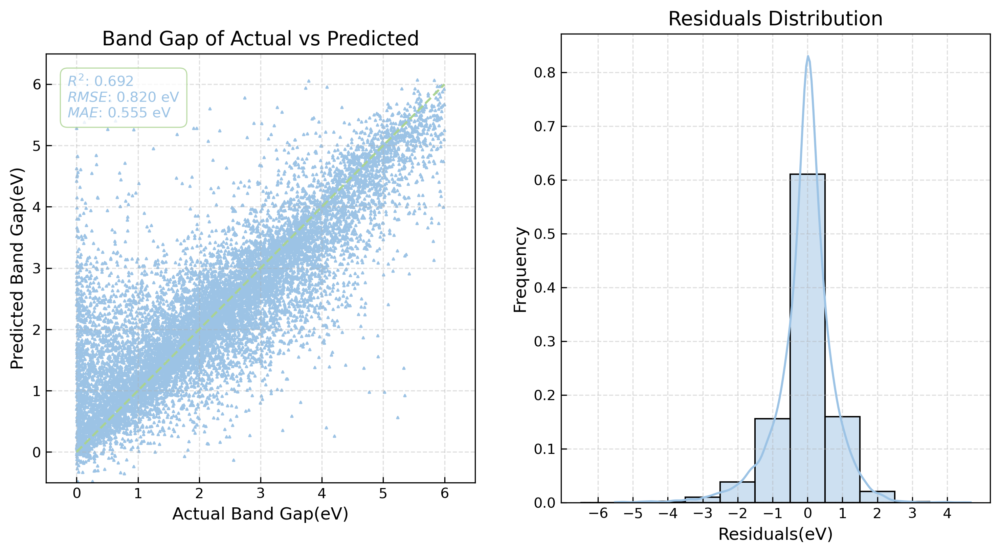


Model Evaluation Results:
Test set: R²: 0.6924 RMSE: 0.8198 MAE: 0.5550


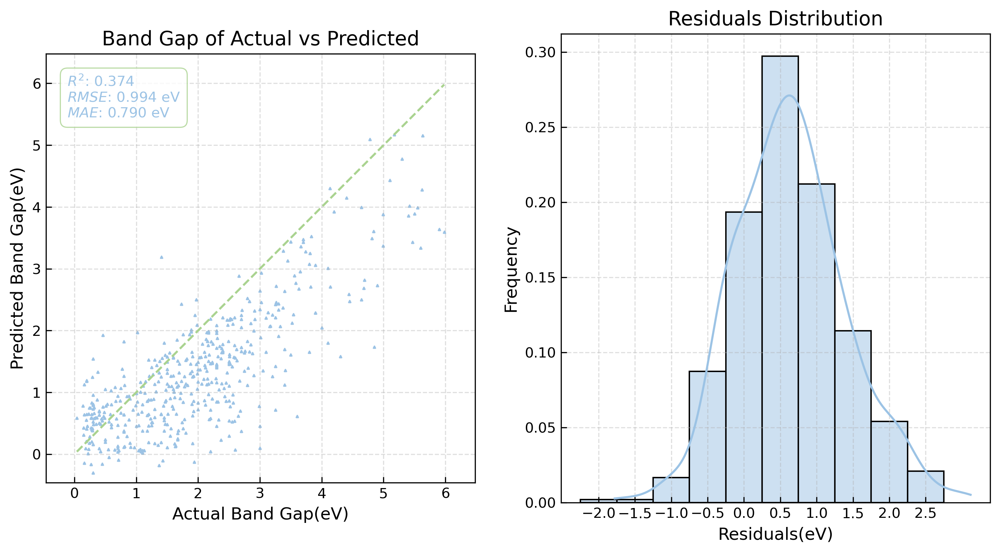


Model Evaluation Results:
Test set: R²: 0.3744 RMSE: 0.9940 MAE: 0.7896


In [51]:
# dft train
svr.train(dft_train_X, dft_train_y)
# test on dft test set
metrics = svr.evaluate(dft_test_X, dft_test_y, fig_path=os.path.join(file_path, 'figures', 'dft_train_dft_test.png'))
# record metrics
model_metrics.loc[len(model_metrics)] = {
    'Model': 'SVR',
    'Train': 'dft',
    'Test': 'dft',
    'R²': metrics['r2'],
    'RMSE': metrics['rmse'],
    'MAE': metrics['mae']
}
# test on exp test set
metrics = svr.evaluate(exp_test_X, exp_test_y, fig_path=os.path.join(file_path, 'figures', 'dft_train_exp_test.png'))
# record metrics
model_metrics.loc[len(model_metrics)] = {
    'Model': 'SVR',
    'Train': 'dft',
    'Test': 'exp',
    'R²': metrics['r2'],
    'RMSE': metrics['rmse'],
    'MAE': metrics['mae']
}

In [52]:
# dft train model save
svr.save_model(os.path.join(file_path, 'model', 'dft_train_model.pkl'))
# model predictions save
svr.save_prediction(dft_test_X, dft_test_y, os.path.join(file_path, 'predictions', 'dft_train_dft_test.csv'), save_df=dft_test)
svr.save_prediction(exp_test_X, exp_test_y, os.path.join(file_path, 'predictions', 'dft_train_exp_test.csv'), save_df=exp_test)

Model saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\SVR\model\dft_train_model.pkl
Predictions saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\SVR\predictions\dft_train_dft_test.csv
Predictions saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\SVR\predictions\dft_train_exp_test.csv


#### 5.2 EXP model

Starting model training...
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[LibSVM][Pipeline] ............. (step 2 of 2) Processing model, total=   0.6s
Model training completed!


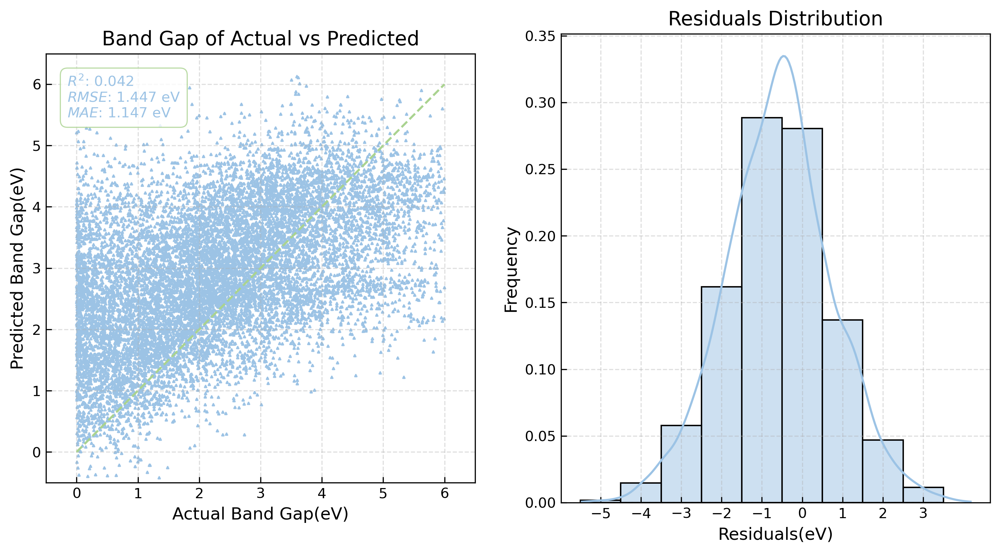


Model Evaluation Results:
Test set: R²: 0.0417 RMSE: 1.4470 MAE: 1.1469


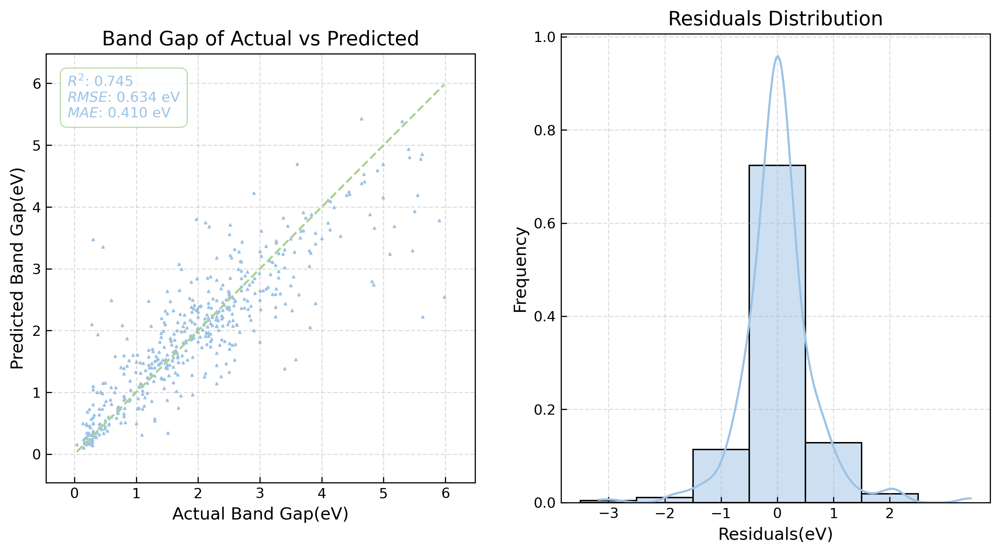


Model Evaluation Results:
Test set: R²: 0.7452 RMSE: 0.6344 MAE: 0.4104


In [54]:
# exp train
svr.train(exp_train_X, exp_train_y)
# test on dft test set
metrics = svr.evaluate(dft_test_X, dft_test_y, fig_path=os.path.join(file_path, 'figures', 'exp_train_dft_test.png'))
# record metrics
model_metrics.loc[len(model_metrics)] = {
    'Model': 'SVR',
    'Train': 'exp',
    'Test': 'dft',
    'R²': metrics['r2'],
    'RMSE': metrics['rmse'],
    'MAE': metrics['mae']
}
# test on exp test set
metrics = svr.evaluate(exp_test_X, exp_test_y, fig_path=os.path.join(file_path, 'figures', 'exp_train_exp_test.png'))
# record metrics
model_metrics.loc[len(model_metrics)] = {
    'Model': 'SVR',
    'Train': 'exp',
    'Test': 'exp',
    'R²': metrics['r2'],
    'RMSE': metrics['rmse'],
    'MAE': metrics['mae']
}


In [53]:
# exp train model save
svr.save_model(os.path.join(file_path, 'model', 'exp_train_model.pkl'))
# model predictions save
svr.save_prediction(dft_test_X, dft_test_y, os.path.join(file_path, 'predictions', 'exp_train_dft_test.csv'), save_df=dft_test)
svr.save_prediction(exp_test_X, exp_test_y, os.path.join(file_path, 'predictions', 'exp_train_exp_test.csv'), save_df=exp_test)

Model saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\SVR\model\exp_train_model.pkl
Predictions saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\SVR\predictions\exp_train_dft_test.csv
Predictions saved to: c:\Users\Fortyfour\Desktop\graduation_design\Scripts_git\Models\SVR\predictions\exp_train_exp_test.csv


In [55]:
model_metrics

,Model,Train,Test,R²,RMSE,MAE
0,GBDT,dft,dft,0.647468,0.877631,0.669231
1,GBDT,dft,exp,0.343692,1.018073,0.808413
2,GBDT,exp,dft,0.046973,1.442996,1.114322
3,GBDT,exp,exp,0.791603,0.573681,0.408493
4,KRR,dft,dft,0.631742,0.896992,0.676967
5,KRR,dft,exp,0.361538,1.004136,0.788429
6,KRR,exp,dft,0.078652,1.418811,1.118420
7,KRR,exp,exp,0.720112,0.664840,0.475530
8,RF,dft,dft,0.775766,0.699945,0.462198
9,RF,dft,exp,0.451256,0.930914,0.744540


In [57]:
# sort by rmse
model_metrics = model_metrics.sort_values(by='RMSE', ascending=True).reset_index(drop=True)
model_metrics

,Model,Train,Test,R²,RMSE,MAE
0,GBDT,exp,exp,0.791603,0.573681,0.408493
1,RF,exp,exp,0.772715,0.599115,0.409621
2,SVR,exp,exp,0.745188,0.634359,0.410439
3,KRR,exp,exp,0.720112,0.664840,0.475530
4,RF,dft,dft,0.775766,0.699945,0.462198
5,RR,exp,exp,0.668590,0.723448,0.533021
6,SVR,dft,dft,0.692371,0.819835,0.554953
7,GBDT,dft,dft,0.647468,0.877631,0.669231
8,KRR,dft,dft,0.631742,0.896992,0.676967
9,RF,dft,exp,0.451256,0.930914,0.744540


In [ ]:
# save model metrics
model_metrics.to_csv(os.path.join(current_path, 'model_metrics.csv'), index=False)